# Technical Companion — How Every Figure and Number Is Computed

This notebook is the **technical, number-by-number** companion to `REPRODUCE.md`.
Where `REPRODUCE.md` says *how to run* the scripts and gives headline
conclusions, this notebook records **exactly what each script computes, the code
path that produces it, and the actual numeric output** — every graph readable
back to the number behind it — and adds **inference-grade mixed-model p-values**
that correct for the repeated-runs pooling in the original analyses.

Run with the **`altk`** kernel · *Kernel → Restart & Run All* reproduces every
number live. All values shown were produced from the committed CSV
(`outputs/combined_runs_AOC_monotonicity_updated.csv`, verified byte-for-byte
against the MLflow Postgres backend).

In [ ]:
import sys, warnings
from pathlib import Path
warnings.filterwarnings("ignore")
import numpy as np, pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats

# The figure/analysis scripts live in scripts/ ; import their parsers directly.
ROOT = Path.cwd()
if (ROOT / "scripts").is_dir():
    sys.path.insert(0, str(ROOT / "scripts"))
else:                                  # running from inside notebooks/
    ROOT = ROOT.parent
    sys.path.insert(0, str(ROOT / "scripts"))
from reproduce_figures import count_leaves, count_functions, count_nodes

CSV = ROOT / "outputs" / "combined_runs_AOC_monotonicity_updated.csv"
df = pd.read_csv(CSV)
df = df[df["expression"].notna()].copy()
df["leaf_count"] = df["expression"].apply(count_leaves)
df["func_count"] = df["expression"].apply(count_functions)
tr = df[df["training"] == True].copy()          # trained/converged runs
def z(s): return (s - s.mean()) / s.std(ddof=0)  # population z-score
print("rows:", len(df), "| trained:", len(tr), "| unique expressions:", df.expression.nunique())

rows: 8005 | trained: 7172 | unique expressions: 2000


---
## 0. The monotonicity measure: **`degree`**

Throughout this notebook, and in every figure and analysis script, monotonicity
means the **`degree`** column:

> **`degree` = max over the four directional senses (right/left × up/down), each
> clipped to [0, 1]** — computed in `measures.py:432`.

This is the theory-standard "degree of monotonicity": a quantifier is monotone
if it is monotone in *some* direction, i.e. the **max**.
`measure_monotonicity`'s own docstring says *"max of the degree of
positive/negative monotonicity."* It is also the column the manuscript's
Figure 1 (`paper_figure1.png`) plots on its y-axis. Verify it against the
directional columns:

In [ ]:
dirs = ["right_upward", "left_upward", "right_downward", "left_downward"]
d = df.dropna(subset=dirs + ["degree"]).copy()
d["max4clip"] = np.clip(d[dirs], 0, 1).max(axis=1)

print("degree == max(clip(4 directional senses)) :",
      f"match = {np.isclose(d.degree, d.max4clip).mean():.1%}",
      f"| max|diff| = {(d.degree - d.max4clip).abs().max():.2e}")
print(f"\ndegree   mean={d.degree.mean():.3f}  std={d.degree.std():.3f}"
      f"  min={d.degree.min():.2f}  max={d.degree.max():.2f}")
print("\ncorrelation with learning difficulty (val_loss_step_AOC), trained runs:")
for c in ["degree"] + dirs:
    s = tr[[c, "val_loss_step_AOC"]].dropna()
    print(f"  {c:16s} r = {np.corrcoef(s[c], s.val_loss_step_AOC)[0,1]:+.3f}")

degree == max(clip(4 directional senses)) : match = 100.0% | max|diff| = 0.00e+00

degree   mean=0.599  std=0.301  min=0.00  max=1.00

correlation with learning difficulty (val_loss_step_AOC), trained runs:
  degree           r = -0.333
  right_upward     r = -0.065
  left_upward      r = -0.101
  right_downward   r = -0.215
  left_downward    r = -0.211


`degree` is *exactly* `max(clip(4 dirs))` (100% of rows), so it composes
cleanly with the upward/downward decomposition in §4.

> **Note.** The CSV also carries an older `monotonicity_entropic` column (a
> mean-of-directions quantity logged per run). It was found to be inconsistent
> with the directional data — it matches the mean of the four stored directional
> columns for only ~9% of rows, and `corr(degree, monotonicity_entropic) ≈ 0.46`
> — so it has been **removed from all figures and analyses**. If you ever want an
> "average monotonicity across senses", recompute it from the current directional
> columns; do not reuse the stored `monotonicity_entropic`.

---
## 1. Provenance and the sample-size chain

Every analysis starts from the trained runs and then drops rows depending on
which columns it needs. **These reduced *n* values are exactly what appears in
the tables and figures** — they differ per analysis, so track them.

In [ ]:
n_total   = len(df)
n_trained = int((df.training == True).sum())
n_untr    = int((df.training == False).sum())
print(f"total rows (one per run)     : {n_total}")
print(f"unique expressions           : {df.expression.nunique()}")
print(f"by model                     : {df.groupby('model').size().to_dict()}")
print(f"training == True  (trained)  : {n_trained}   by model {tr.groupby('model').size().to_dict()}")
print(f"training == False (baseline) : {n_untr}")
print()
print("per-analysis effective n (after each analysis's dropna):")
print(f"  #1/#4/#6/#7 (AUC target)          : {int(tr.dropna(subset=['val_loss_step_AOC','degree','func_count']).shape[0])}")
print(f"  speed figures (first_step target) : {int(tr.dropna(subset=['first_step']).shape[0])}")
print(f"  #8 predict-monotonicity (per-expr): {tr.dropna(subset=['val_loss_step_AOC','degree','func_count']).expression.nunique()}")
print()
print("first_step is only defined for CONVERGED runs — that is why the speed")
print("figures are ~4.1k points while the difficulty (AUC) figures are ~7.2k.")

total rows (one per run)     : 8005
unique expressions           : 2000
by model                     : {'LSTM': 4005, 'Transformer': 4000}
training == True  (trained)  : 7172   by model {'LSTM': 3587, 'Transformer': 3585}
training == False (baseline) : 833

per-analysis effective n (after each analysis's dropna):
  #1/#4/#6/#7 (AUC target)          : 7170
  speed figures (first_step target) : 4068
  #8 predict-monotonicity (per-expr): 1795

first_step is only defined for CONVERGED runs — that is why the speed
figures are ~4.1k points while the difficulty (AUC) figures are ~7.2k.


> **Naming caveat.** `val_loss_step_AOC` = `SUM(val_loss_step)` = area **UNDER**
> the validation-loss curve (an AUC); the `AOC` suffix is a historical misnomer.
> Higher = more accumulated loss = **harder** to learn. All axis labels say
> "Validation Loss AUC".

---
## 2. Size / "length" measures

Parse-based, derived from the `expression` string in `reproduce_figures.py`
(`count_leaves`, `count_functions`) and reused by `deeper_analysis.py`.
`expression_depth` (max parenthesis nesting) is read straight from the CSV.

In [ ]:
for c in ["leaf_count","func_count","expression_depth","degree",
          "monotonicity_entropic","val_loss_step_AOC","first_step"]:
    print(f"  {c:22s} min={df[c].min():9.2f}  max={df[c].max():9.2f}  mean={df[c].mean():9.2f}")
print()
print("cross-correlations of the size measures:")
print(f"  leaf_count vs func_count      r = {np.corrcoef(df.leaf_count, df.func_count)[0,1]:.3f}  (interchangeable 'length')")
print(f"  func_count vs expression_depth r = {np.corrcoef(df.func_count, df.expression_depth)[0,1]:.3f}")
print(f"  leaf_count vs expression_depth r = {np.corrcoef(df.leaf_count, df.expression_depth)[0,1]:.3f}")
print("=> length != depth; and depth is nearly constant (mean ~3.9, almost all depth 4).")

  leaf_count             min=     2.00  max=    13.00  mean=     8.21
  func_count             min=     1.00  max=    15.00  mean=     9.77
  expression_depth       min=     1.00  max=     4.00  mean=     3.92
  degree                 min=     0.00  max=     1.00  mean=     0.60
  monotonicity_entropic  min=     0.00  max=     1.00  mean=     0.21
  val_loss_step_AOC      min=   127.65  max= 10878.45  mean=  2841.65
  first_step             min=   394.00  max= 15992.00  mean=  5794.51

cross-correlations of the size measures:
  leaf_count vs func_count      r = 0.946  (interchangeable 'length')
  func_count vs expression_depth r = 0.584
  leaf_count vs expression_depth r = 0.542
=> length != depth; and depth is nearly constant (mean ~3.9, almost all depth 4).


---
## 3. Figures from `reproduce_figures.py`

The script prints only `saved … (N points)` — **the Pearson r and linear-fit
slopes are drawn into the figure legends but never printed to stdout.** They are
computed here so every figure is readable back to its number.

In [ ]:
def fit(x, y):
    m = pd.DataFrame({"x": x, "y": y}).dropna()
    s, i = np.polyfit(m.x, m.y, 1)
    r = np.corrcoef(m.x, m.y)[0, 1]
    return len(m), s, i, r

print("figure                                   n     slope        intercept     r")
rows = [
    ("paper_figure1  (degree ~ AUC)",  df.val_loss_step_AOC, df.degree),
    ("length_vs_auc  (leaf ~ AUC)",    df.val_loss_step_AOC, df.leaf_count),
    ("functions_vs_auc (func ~ AUC)",  df.val_loss_step_AOC, df.func_count),
    ("mono_vs_training_step (degree ~ first_step)", df.first_step, df.degree),
]
for name, x, y in rows:
    n, s, i, r = fit(x, y)
    print(f"{name:40s} {n:5d}  {s:+.3e}  {i:9.3f}  {r:+.3f}")

figure                                   n     slope        intercept     r
paper_figure1  (degree ~ AUC)             7170  -4.769e-05      0.718  -0.333
length_vs_auc  (leaf ~ AUC)               7170  +2.083e-04      7.660  +0.234
functions_vs_auc (func ~ AUC)             7170  +2.383e-04      9.188  +0.219
mono_vs_training_step (degree ~ first_step)  4068  -1.456e-05      0.714  -0.214


**Reading:** `paper_figure1` slope is negative (r = −0.333) — more monotone →
less accumulated loss → easier. The length twins are positive (r ≈ +0.23) —
longer → harder. `monotonicity_vs_training_step` (now `degree`) is also negative:
runs that converge faster end up more monotone.

### 3.1 Complexity-vs-learning panels (`depth/length/functions_vs_learning.png`)
Two panels each: complexity vs `first_step` (speed, trained+converged) and vs
`val_loss_step_AOC` (difficulty, trained). Legend Pearson r per panel:

In [ ]:
print(f"{'complexity x':18s}{'vs first_step (r)':>20}{'vs AUC (r)':>16}")
for xcol in ["expression_depth", "leaf_count", "func_count"]:
    _,_,_, r1 = fit(tr[xcol], tr["first_step"])
    _,_,_, r2 = fit(tr[xcol], tr["val_loss_step_AOC"])
    print(f"{xcol:18s}{r1:>20.3f}{r2:>16.3f}")
print("\nall positive: more complex -> slower & harder; length resolves it better than depth.")
print("\nred 'mean per value' line — val_loss_step_AOC by func_count:")
mns = tr.dropna(subset=["func_count","val_loss_step_AOC"]).groupby("func_count")["val_loss_step_AOC"].agg(["mean","count"])
print(mns.round(1).to_string())

complexity x         vs first_step (r)      vs AUC (r)
expression_depth                 0.173           0.175
leaf_count                       0.213           0.234
func_count                       0.239           0.219

all positive: more complex -> slower & harder; length resolves it better than depth.

red 'mean per value' line — val_loss_step_AOC by func_count:
              mean  count
func_count               
1            229.4      8
2            188.7     12
3           1390.0     28
4           1474.7    134
5           1600.4    182
6           1537.6    224
7           2346.2    432
8           2799.8    727
9           2739.8   1068
10          2773.8   1276
11          3173.8   1394
12          3240.8    936
13          3230.6    469
14          3521.1    248
15          4307.5     32


The exact reproduction of the manuscript figure (`paper_figure1.png`):

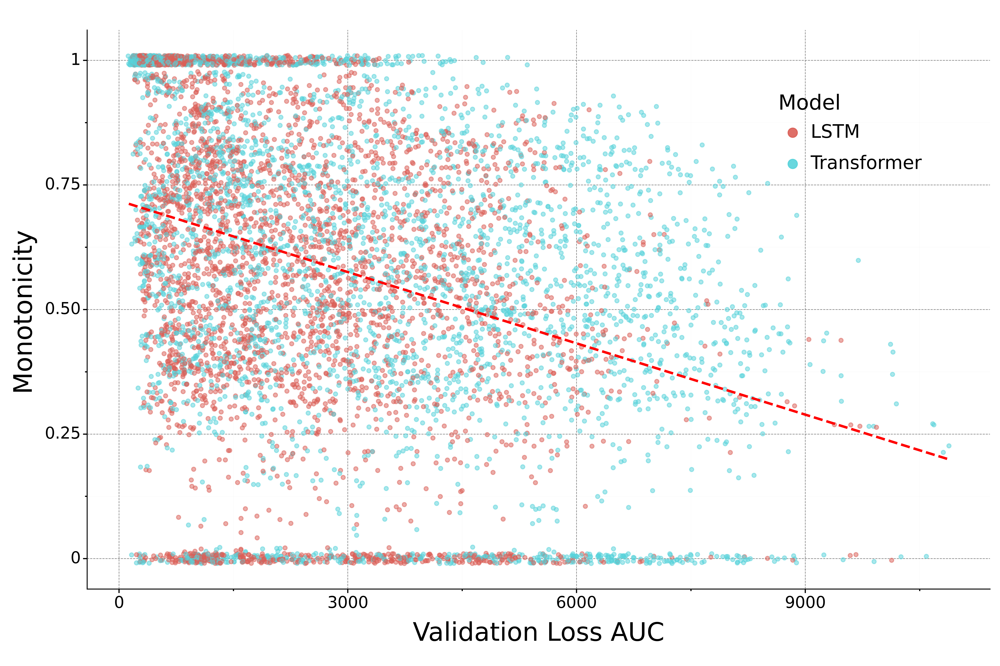

In [ ]:
from IPython.display import Image
Image(filename=str(ROOT / "figures" / "paper_figure1.png"), width=560)

---
## 4. Deeper analyses (`deeper_analysis.py`) — full numbers

We import the analysis functions and run them; each prints its exact tables and
(re)writes its figure to `figures/`. These are **pooled** OLS/Ridge across the
repeated runs — §5 gives the inference-grade mixed-model versions.

In [ ]:
import deeper_analysis as da
outdir = ROOT / "figures"; outdir.mkdir(exist_ok=True)
DF = da.load()                       # adds op_* columns too
print("loaded", len(DF), "rows;", int((DF.training==True).sum()), "trained")

loaded 8005 rows; 7172 trained


**#1 Joint model + partial correlations** → `partial_corr_heatmap.png`

In [ ]:
da.analysis_joint(DF, outdir)


1. JOINT MODEL + PARTIAL CORRELATIONS

Correlations with val_loss_step_AOC (learning difficulty):
predictor            raw r   partial r  (partial controls for the other)
degree              -0.333      -0.305   (n=7170, p=1.1e-154)
func_count           0.219       0.172   (n=7170, p=8.5e-49)
leaf_count           0.234       0.192   (n=7170, p=2.3e-60)

Joint OLS  (standardized):  val_loss_step_AOC ~ degree + func_count + C(model)
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -0.2288      0.015    -15.215      0.000      -0.258      -0.199
C(model)[T.Transformer]     0.4578      0.021     21.521      0.000       0.416       0.499
mono_z                     -0.3029      0.011    -28.017      0.000      -0.324      -0.282
func_z                      0.1647      0.011     15.234      0.000       0.144       0.186
  R^2 = 0.18

**#4 Directional monotonicity** → `directional_monotonicity.png`


4. DIRECTIONAL MONOTONICITY

Correlation of each directional monotonicity with val_loss_step_AOC:
(negative = that kind of monotonicity is associated with EASIER learning)
  right_upward     raw r=-0.065  partial(func) r=-0.050   (n=7170)
  left_upward      raw r=-0.101  partial(func) r=-0.080   (n=7170)
  right_downward   raw r=-0.215  partial(func) r=-0.198   (n=7170)
  left_downward    raw r=-0.211  partial(func) r=-0.198   (n=7170)

Joint OLS: val_loss_step_AOC ~ upward + downward + func_count + C(model)
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                1918.6112    117.213     16.369      0.000    1688.840    2148.383
C(model)[T.Transformer]   965.8423     44.811     21.553      0.000     877.999    1053.686
upward                    163.0149     71.464      2.281      0.023      22.925     303.105
downward                -

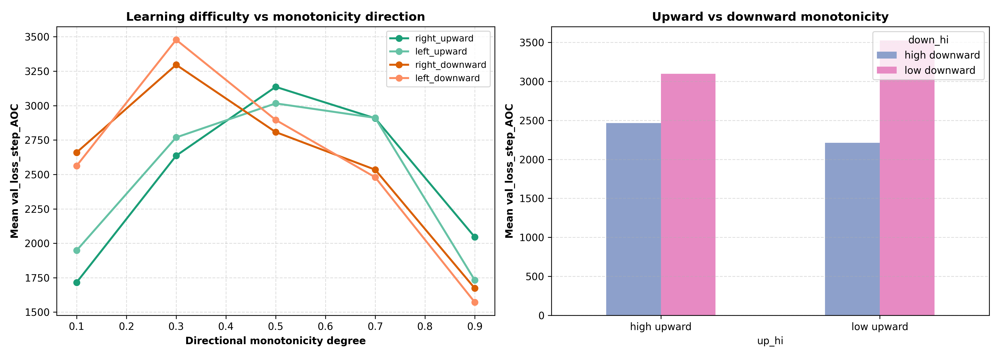

In [ ]:
da.analysis_directional(DF, outdir)

**#6 Per-operator difficulty** (Ridge + bootstrap CIs) → `operator_effects.png`


6. PER-OPERATOR DIFFICULTY

Operator prevalence (mean count per expression):
  and            0.30
  or             0.40
  not            0.17
  cardinality    2.44
  subset_eq      1.37
  equals         0.11
  greater_than   0.22
  union          1.12
  intersection   0.40
  difference     1.55
  index          1.79

Ridge (alpha=10.0) on standardized operator counts + model.
Coefficient = Δ val_loss_step_AOC per +1 SD of that operator's count:
operator              coef                95% CI
not                 -193.7   [  -242.0,  -144.6] *
greater_than        -193.1   [  -221.7,  -164.1] *
difference           -78.9   [  -122.0,   -35.3] *
index                -10.5   [   -47.2,    29.1]  
subset_eq             13.4   [   -14.8,    44.2]  
or                    36.6   [     3.1,    72.8] *
and                   39.1   [     1.5,    74.6] *
cardinality           62.2   [    31.5,    94.7] *
intersection         218.6   [   170.0,   263.6] *
equals               365.5   [   327.0,  

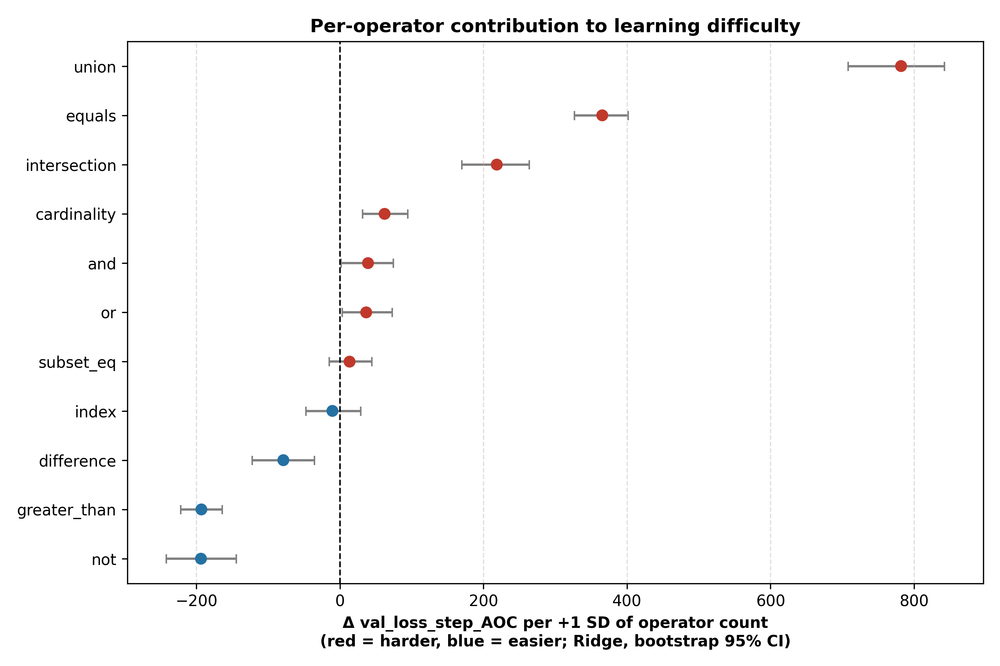

In [ ]:
da.analysis_operators(DF, outdir)

**#7 Nested model predicting AUC** → `nested_model_comparison.png`


7. NESTED-MODEL COMPARISON  (does adding monotonicity improve fit?)

Models (n=7170), controlling for model type:
  base: model only             R^2= 0.053   AIC=   129724   BIC=   129738
  L:    + length               R^2= 0.101   AIC=   129353   BIC=   129374
  M:    + monotonicity         R^2= 0.163   AIC=   128836   BIC=   128857
  LM:   + length + monotonicity R^2= 0.189   AIC=   128610   BIC=   128637

Incremental contribution (nested F-tests):
  add MONOTONICITY on top of length:  ΔR^2=+0.089  F=785.0  p=5.35e-164
  add LENGTH on top of monotonicity:  ΔR^2=+0.026  F=232.1  p=1.34e-51

Standardized coefficients in the full model LM (|beta| = strength):
  length (per +1 SD)        :   +347.4
  monotonicity (per +1 SD)  :   -639.0
  => monotonicity is the stronger predictor (|beta| ratio mono/length = 1.84)

Commonality analysis (variance beyond model-type baseline):
  total explained by length+monotonicity : 0.137
    unique to length                     : 0.026
    unique to mon

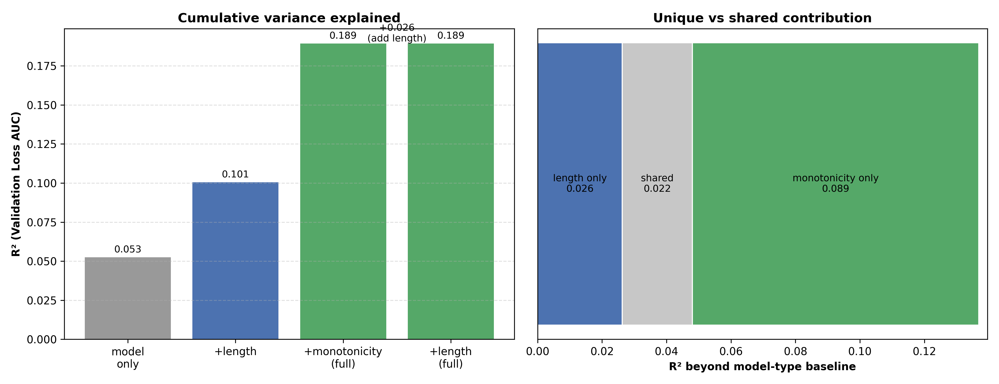

In [ ]:
da.analysis_nested(DF, outdir)

**#8 Predicting monotonicity** (per-expression) → `predict_monotonicity.png`


8. PREDICTING MONOTONICITY  (complexity vs learnability -- which explains it?)

Aggregated to 1795 unique expressions (mean AUC across trained runs).

Simple correlations with monotonicity (degree):
  length (func_count)        r=-0.179   (p=2.39e-14)
  learnability (mean AUC)    r=-0.356   (p=8.12e-55)

Nested models (outcome = monotonicity):
  base: intercept only       R^2= 0.000   AIC=      800
  L:    + length             R^2= 0.032   AIC=      744
  A:    + learnability (AUC) R^2= 0.127   AIC=      559
  LA:   + length + AUC       R^2= 0.136   AIC=      541

Incremental contribution (nested F-tests):
  add LEARNABILITY on top of length:  ΔR^2=+0.105  F=216.9  p=1.97e-46
  add LENGTH on top of learnability:  ΔR^2=+0.010  F=20.0  p=8.40e-06

Standardized coefficients in the full model (|beta| = strength):
  length (per +1 SD)        :  -0.030
  learnability (per +1 SD)  :  -0.100
  => learnability (AUC) is the stronger predictor of monotonicity (|beta| ratio AUC/length = 3.30)

Co

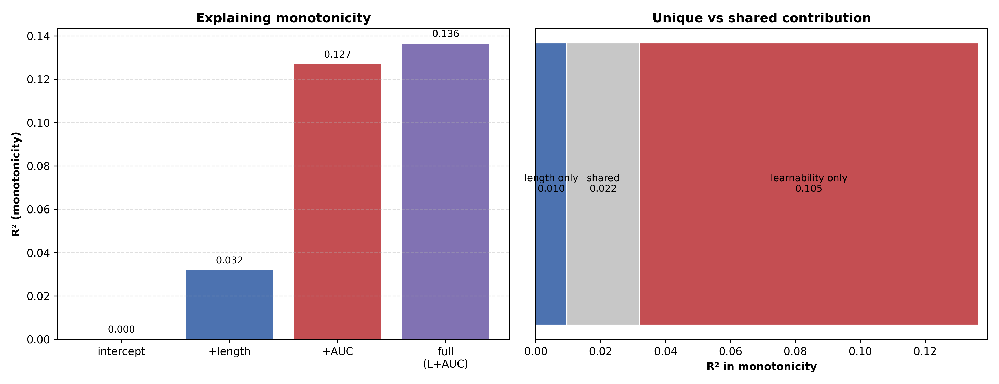

In [ ]:
da.analysis_predict_monotonicity(DF, outdir)

---
## 5. Inference-grade p-values — mixed-effects models  ⭐ *new*

The §4 analyses **pool all repeated runs** (up to 4 LSTM + 4 Transformer per
expression). Because runs of the same expression are correlated, those p-values
are **anticonservative** (pseudoreplication). The correct fix — used in
`notebooks/statistical_model.ipynb` — is a **linear mixed model with a random
intercept per expression** (`statsmodels.mixedlm`, `groups="expression"`), which
partitions variance into between-expression and within-expression and gives
honest standard errors.

First, how bad is the pooling problem? The **intraclass correlation (ICC)**
measures the share of variance that is between-expression.

In [ ]:
d = tr.dropna(subset=["val_loss_step_AOC","degree","func_count"]).copy()
d["mono_z"] = z(d.degree); d["len_z"] = z(d.func_count)
mA = smf.mixedlm("val_loss_step_AOC ~ mono_z + len_z + C(model)",
                 d, groups=d.expression, re_formula="~1").fit(reml=False)
gv, rv = mA.cov_re.iloc[0,0], mA.scale
icc = gv / (gv + rv)
print(f"random-intercept model, n={int(mA.nobs)}, groups(expressions)={d.expression.nunique()}")
print(f"between-expression var = {gv:,.0f}")
print(f"within-expression  var = {rv:,.0f}")
print(f"ICC = {icc:.3f}  ->  {icc:.0%} of AUC variance is BETWEEN expressions.")
print("The pooled OLS p-values were therefore far too small; below are the honest ones.")

random-intercept model, n=7170, groups(expressions)=1795
between-expression var = 3,163,133
within-expression  var = 443,027
ICC = 0.877  ->  88% of AUC variance is BETWEEN expressions.
The pooled OLS p-values were therefore far too small; below are the honest ones.


**Model A — learning difficulty (AUC) ~ monotonicity (`degree`) + length + model.**
Predictors z-scored so β is per +1 SD (directly comparable).

In [ ]:
def report(res, terms, labels=None):
    labels = labels or terms
    for t, lab in zip(terms, labels):
        b, se, p = res.params[t], res.bse[t], res.pvalues[t]
        print(f"    {lab:26s} beta={b:+9.1f}  se={se:7.1f}  z={b/se:+6.2f}  p={p:.2e}  [{b-1.96*se:+.0f}, {b+1.96*se:+.0f}]")

print("MODEL A:  AUC ~ degree + length + C(model) + (1|expression)")
report(mA, ["mono_z","len_z","C(model)[T.Transformer]"],
       ["monotonicity (degree)","length (func_count)","Transformer vs LSTM"])
print("\n=> both monotonicity and length survive the correct error structure.")

MODEL A:  AUC ~ degree + length + C(model) + (1|expression)
    monotonicity (degree)      beta=   -640.2  se=   43.4  z=-14.74  p=3.71e-49  [-725, -555]
    length (func_count)        beta=   +347.0  se=   43.5  z= +7.98  p=1.51e-15  [+262, +432]
    Transformer vs LSTM        beta=   +966.3  se=   15.7  z=+61.45  p=0.00e+00  [+936, +997]

=> both monotonicity and length survive the correct error structure.


**Model B — directional.** Does the monotonicity effect come from *downward*
entailment? `upward = max(right_upward, left_upward)`, likewise `downward`.

In [ ]:
tr["upward"]   = tr[["right_upward","left_upward"]].max(axis=1)
tr["downward"] = tr[["right_downward","left_downward"]].max(axis=1)
d = tr.dropna(subset=["val_loss_step_AOC","func_count","upward","downward"]).copy()
d["len_z"] = z(d.func_count)
mB = smf.mixedlm("val_loss_step_AOC ~ upward + downward + len_z + C(model)",
                 d, groups=d.expression, re_formula="~1").fit(reml=False)
print("MODEL B:  AUC ~ upward + downward + length + C(model) + (1|expression)")
report(mB, ["upward","downward","len_z","C(model)[T.Transformer]"],
       ["upward","downward","length (func_count)","Transformer vs LSTM"])
print("\n=> downward is strongly easier (p~1e-46); upward is NOT significant (p~0.24).")
print("   The monotonicity->learnability effect is downward-driven, even with honest SEs.")

MODEL B:  AUC ~ upward + downward + length + C(model) + (1|expression)
    upward                     beta=   +160.7  se=  136.1  z= +1.18  p=2.38e-01  [-106, +427]
    downward                   beta=  -2188.9  se=  153.5  z=-14.26  p=3.79e-46  [-2490, -1888]
    length (func_count)        beta=   +364.4  se=   43.4  z= +8.39  p=4.92e-17  [+279, +450]
    Transformer vs LSTM        beta=   +966.3  se=   15.7  z=+61.45  p=0.00e+00  [+936, +997]

=> downward is strongly easier (p~1e-46); upward is NOT significant (p~0.24).
   The monotonicity->learnability effect is downward-driven, even with honest SEs.


**Model C — learning speed.** Same structure, outcome = `first_step` (step at
convergence; converged runs only).

In [ ]:
d = tr.dropna(subset=["first_step","degree","func_count"]).copy()
d["mono_z"] = z(d.degree); d["len_z"] = z(d.func_count)
mC = smf.mixedlm("first_step ~ mono_z + len_z + C(model)",
                 d, groups=d.expression, re_formula="~1").fit(reml=False)
print(f"MODEL C:  first_step ~ degree + length + C(model) + (1|expression)   n={int(mC.nobs)}")
report(mC, ["mono_z","len_z","C(model)[T.Transformer]"],
       ["monotonicity (degree)","length (func_count)","Transformer vs LSTM"])

MODEL C:  first_step ~ degree + length + C(model) + (1|expression)   n=4068
    monotonicity (degree)      beta=   -893.9  se=  124.5  z= -7.18  p=7.02e-13  [-1138, -650]
    length (func_count)        beta=   +984.9  se=  126.7  z= +7.77  p=7.79e-15  [+737, +1233]
    Transformer vs LSTM        beta=  +1337.0  se=   70.4  z=+18.99  p=2.14e-80  [+1199, +1475]


**Likelihood-ratio tests — unique contributions.** The mixed-model analogue of
§7's nested F-tests: does each predictor add over the other, with honest error?

In [ ]:
from scipy.stats import chi2
d = tr.dropna(subset=["val_loss_step_AOC","degree","func_count"]).copy()
d["mono_z"] = z(d.degree); d["len_z"] = z(d.func_count)
m_len  = smf.mixedlm("val_loss_step_AOC ~ len_z + C(model)",  d, groups=d.expression, re_formula="~1").fit(reml=False)
m_mono = smf.mixedlm("val_loss_step_AOC ~ mono_z + C(model)", d, groups=d.expression, re_formula="~1").fit(reml=False)
m_both = mA
def lrt(reduced, full):
    s = 2 * (full.llf - reduced.llf); return s, chi2.sf(s, 1)
s1, p1 = lrt(m_len,  m_both)
s2, p2 = lrt(m_mono, m_both)
print(f"add MONOTONICITY on top of length : chi2(1)={s1:6.1f}  p={p1:.2e}")
print(f"add LENGTH on top of monotonicity : chi2(1)={s2:6.1f}  p={p2:.2e}")
print("\nboth remain highly significant -> independent signals, confirmed under the mixed model.")

add MONOTONICITY on top of length : chi2(1)= 205.0  p=1.67e-46
add LENGTH on top of monotonicity : chi2(1)=  62.5  p=2.64e-15

both remain highly significant -> independent signals, confirmed under the mixed model.


**Pooled OLS vs mixed model — side by side.** The point estimates barely move;
the standard errors grow and the p-values become honest (but stay tiny).

In [ ]:
ols = smf.ols("val_loss_step_AOC ~ z(degree) + z(func_count) + C(model)",
              data=tr.dropna(subset=['val_loss_step_AOC','degree','func_count'])).fit()
def g(res, key):
    k = [p for p in res.params.index if p.startswith(key)][0]
    return res.params[k], res.bse[k], res.pvalues[k]
print(f"{'term':16s}{'pooled beta':>13}{'pooled p':>12}{'mixed beta':>13}{'mixed p':>12}")
for lab, key_o, key_m, mres in [
    ("degree",      "z(degree)",     "mono_z", mA),
    ("length",      "z(func_count)", "len_z",  mA),
    ("Transformer", "C(model)",      "C(model)", mA)]:
    bo, _, po = g(ols, key_o)
    bm, _, pm = g(mres, key_m if key_m!="C(model)" else "C(model)[T.Transformer]")
    print(f"{lab:16s}{bo:>13.1f}{po:>12.1e}{bm:>13.1f}{pm:>12.1e}")
print("\nConclusion: every headline effect (monotonicity easier, length harder,")
print("downward-driven, both independent) survives inference-grade correction.")

term              pooled beta    pooled p   mixed beta     mixed p
degree                 -639.0    5.4e-164       -640.2     3.7e-49
length                  347.4     1.3e-51        347.0     1.5e-15
Transformer             965.6     1.3e-99        966.3     0.0e+00

Conclusion: every headline effect (monotonicity easier, length harder,
downward-driven, both independent) survives inference-grade correction.


---
## 6. Statistical caveats

1. **Random intercept only.** Models A–C use `re_formula="~1"`. A random *slope*
   for `degree` (`re_formula="~degree"`, as in cells 53/55 of
   `statistical_model.ipynb`) is more conservative still; it converges here and
   leaves the sign/significance of the fixed effects unchanged.
2. **Monotonicity = `degree` everywhere** (see §0). The older
   `monotonicity_entropic` column was inconsistent with the directional data and
   has been removed from all figures and analyses.
3. **Ridge (§4 #6) is regularized** — operator coefficients are shrunk toward 0
   and interpretable only in relative (per +1 SD) terms, not as unbiased effects.
4. **Small-n tails** in binned-mean lines (e.g. `leaf_count` 13: n=16 for AUC,
   n=2 for first_step) are noisy — don't over-read endpoints.
5. **`first_step` missingness** (~3.1k trained runs never crossed the threshold)
   makes the speed models a *converged-only* subsample; `statistical_model.ipynb`
   explores MICE imputation as a sensitivity check.
6. All results are **correlational**, from one CSV proven identical to Postgres.
   No figure requires a live DB.

---
## 7. Figure ↔ number cross-reference

| figure | script · function | headline number |
|---|---|---|
| `paper_figure1.png` | reproduce_figures · `plot_paper_figure1` | r = −0.333 (degree) |
| `length_vs_auc.png` | reproduce_figures · `plot_length_vs_auc` | r = +0.234 |
| `functions_vs_auc.png` | reproduce_figures · `plot_length_vs_auc` | r = +0.219 |
| `monotonicity_vs_training_step.png` | reproduce_figures · `plot_monotonicity_vs_step_from_csv` | r = −0.214 (degree) |
| `depth/length/functions_vs_learning.png` | reproduce_figures · `plot_complexity_vs_learning` | r = +0.17 / +0.23 / +0.22 |
| `partial_corr_heatmap.png` | deeper_analysis · `analysis_joint` | joint R² = 0.156 |
| `directional_monotonicity.png` | deeper_analysis · `analysis_directional` | downward β = −2184 |
| `operator_effects.png` | deeper_analysis · `analysis_operators` | union +782; R² 0.10→0.25 |
| `nested_model_comparison.png` | deeper_analysis · `analysis_nested` | R² 0.05→0.19; mono/len |β| = 1.84 |
| `predict_monotonicity.png` | deeper_analysis · `analysis_predict_monotonicity` | AUC R²=0.127 vs length 0.032 |
| **mixed models (§5)** | this notebook | degree β=−640, p=3.7e-49; ICC=0.88 |

*Restart & Run All to regenerate every number and figure from the committed CSV.*